In [114]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image

class GradCAM:
    def __init__(self, model, target_layer):
        """
        Initialize GradCAM
        Args:
            model: Pre-trained model
            target_layer: Layer để tính GradCAM (vd: model.layer4)
        """
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        
        # Register hooks
        self.target_layer.register_forward_hook(self.save_activation)
        self.target_layer.register_backward_hook(self.save_gradient)
    
    def save_activation(self, module, input, output):
        """Hook để lưu activation maps"""
        self.activations = output.detach()
    
    def save_gradient(self, module, grad_input, grad_output):
        """Hook để lưu gradients"""
        self.gradients = grad_output[0].detach()
    
    def compute_weights(self, class_idx):
        """
        Tính weights (alpha_i) theo công thức (1) của GradCAM paper
        alpha_i^c = (1/Z) * sum_{i,j} (dY^c / dA_ij^k)
        
        Args:
            class_idx: Index của predicted class
        Returns:
            weights: Tensor chứa weight của từng channel [n_channels]
        """
        # Gradients có shape [batch, channels, height, width]
        # Global Average Pooling của gradients
        weights = torch.mean(self.gradients, dim=[2, 3], keepdim=False)  # [batch, channels]
        
        return weights.squeeze()  # [n_channels]
    
    def forward(self, x, class_idx=None):
        """
        Forward pass và tính GradCAM
        Args:
            x: Input image tensor [1, 3, H, W]
            class_idx: Target class index (None = predicted class)
        Returns:
            weights: Weight của từng channel
            cam: GradCAM heatmap
            pred_class: Predicted class
        """
        # Forward pass
        self.model.eval()
        logits = self.model(x)
        
        # Nếu không chỉ định class, dùng predicted class
        if class_idx is None:
            class_idx = logits.argmax(dim=1).item()
        
        # Zero gradients
        self.model.zero_grad()
        
        # Backward từ pre-softmax score của class c
        one_hot = torch.zeros_like(logits)
        one_hot[0, class_idx] = 1
        logits.backward(gradient=one_hot, retain_graph=True)
        
        # Tính weights (alpha_i)
        weights = self.compute_weights(class_idx)
        
        # Tính GradCAM: L^c = ReLU(sum_i alpha_i * A_i)
        activations = self.activations.squeeze()  # [channels, h, w]
        cam = torch.zeros(activations.shape[1:], dtype=torch.float32)
        
        for i, w in enumerate(weights):
            cam += w * activations[i]
        
        cam = F.relu(cam)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)  # Normalize
        
        return weights, cam, class_idx



In [115]:

def analyze_weight_distribution(weights, top_k=10):
    """
    Phân tích distribution của weights
    Args:
        weights: Tensor chứa weights của các channels
        top_k: Số lượng top channels để hiển thị
    """
    weights_np = weights.cpu().numpy()
    n_channels = len(weights_np)
    
    # Tạo figure với 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # 1. Histogram của weights
    axes[0].hist(weights_np, bins=50, edgecolor='black', alpha=0.7)
    axes[0].set_xlabel('Weight Value (α_i)', fontsize=12)
    axes[0].set_ylabel('Frequency', fontsize=12)
    axes[0].set_title('Distribution of Channel Weights', fontsize=14, fontweight='bold')
    axes[0].grid(True, alpha=0.3)
    
    # Statistics
    mean_w = weights_np.mean()
    std_w = weights_np.std()
    axes[0].axvline(mean_w, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_w:.4f}')
    axes[0].axvline(mean_w + std_w, color='orange', linestyle='--', linewidth=1.5, label=f'±1 Std: {std_w:.4f}')
    axes[0].axvline(mean_w - std_w, color='orange', linestyle='--', linewidth=1.5)
    axes[0].legend()
    
    # 2. Bar plot của top-k channels
    top_indices = np.argsort(weights_np)[-top_k:][::-1]
    top_weights = weights_np[top_indices]
    
    axes[1].bar(range(top_k), top_weights, edgecolor='black', alpha=0.7)
    axes[1].set_xlabel('Rank', fontsize=12)
    axes[1].set_ylabel('Weight Value', fontsize=12)
    axes[1].set_title(f'Top-{top_k} Channel Weights', fontsize=14, fontweight='bold')
    axes[1].set_xticks(range(top_k))
    axes[1].set_xticklabels([f'Ch {idx}' for idx in top_indices], rotation=45)
    axes[1].grid(True, alpha=0.3, axis='y')
    
    # 3. Cumulative distribution
    sorted_weights = np.sort(weights_np)[::-1]
    cumsum = np.cumsum(sorted_weights)
    cumsum_normalized = cumsum / cumsum[-1] * 100
    
    axes[2].plot(range(n_channels), cumsum_normalized, linewidth=2)
    axes[2].set_xlabel('Number of Channels', fontsize=12)
    axes[2].set_ylabel('Cumulative Weight (%)', fontsize=12)
    axes[2].set_title('Cumulative Weight Distribution', fontsize=14, fontweight='bold')
    axes[2].grid(True, alpha=0.3)
    axes[2].axhline(50, color='red', linestyle='--', alpha=0.5, label='50%')
    axes[2].axhline(80, color='orange', linestyle='--', alpha=0.5, label='80%')
    axes[2].legend()
    
    plt.tight_layout()
    # plt.savefig('weight_distribution.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # In thống kê
    print("\n" + "="*60)
    print("WEIGHT DISTRIBUTION ANALYSIS")
    print("="*60)
    print(f"Total channels: {n_channels}")
    print(f"Mean weight: {mean_w:.6f}")
    print(f"Std weight: {std_w:.6f}")
    print(f"Min weight: {weights_np.min():.6f}")
    print(f"Max weight: {weights_np.max():.6f}")
    print(f"Weight range: {weights_np.max() - weights_np.min():.6f}")
    
    # Phân tích concentration
    total_weight = np.sum(np.abs(weights_np))
    top_10_percent = int(n_channels * 0.1)
    top_10_weight = np.sum(np.abs(sorted_weights[:top_10_percent]))
    concentration_ratio = top_10_weight / total_weight * 100
    
    print(f"\nConcentration Analysis:")
    print(f"Top 10% channels ({top_10_percent} channels) contribute: {concentration_ratio:.2f}% of total weight")
    
    # Tìm số channels chiếm 50% và 80% weight
    idx_50 = np.where(cumsum_normalized >= 50)[0][0]
    idx_80 = np.where(cumsum_normalized >= 80)[0][0]
    print(f"Top {idx_50+1} channels contribute 50% of total weight")
    print(f"Top {idx_80+1} channels contribute 80% of total weight")
    
    # Uniformity test (so sánh với uniform distribution)
    uniform_mean = 1.0 / n_channels
    normalized_weights = np.abs(weights_np) / np.sum(np.abs(weights_np))
    kl_divergence = np.sum(normalized_weights * np.log((normalized_weights + 1e-10) / uniform_mean))
    print(f"\nKL Divergence from uniform: {kl_divergence:.6f}")
    if kl_divergence < 0.1:
        print("→ Distribution is nearly UNIFORM")
    elif kl_divergence < 1.0:
        print("→ Distribution is MODERATELY concentrated")
    else:
        print("→ Distribution is HIGHLY concentrated")
    
    print("\n" + "="*60)
    print(f"TOP-{top_k} CHANNELS WITH HIGHEST WEIGHTS")
    print("="*60)
    print(f"{'Rank':<6} {'Channel ID':<12} {'Weight':<15} {'% of Max':<12}")
    print("-"*60)
    
    for rank, (idx, weight) in enumerate(zip(top_indices, top_weights), 1):
        pct = weight / weights_np.max() * 100
        print(f"{rank:<6} {idx:<12} {weight:<15.6f} {pct:<12.2f}%")
    
    print("="*60)
    
    return top_indices, top_weights



In [116]:

def visualize_gradcam(original_img, cam, pred_class, class_name=None):
    """Visualize GradCAM heatmap"""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    axes[0].imshow(original_img)
    axes[0].set_title('Original Image', fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # GradCAM heatmap
    cam_resized = F.interpolate(
        cam.unsqueeze(0).unsqueeze(0),
        size=original_img.size[::-1],
        mode='bilinear',
        align_corners=False
    ).squeeze().cpu().numpy()
    
    axes[1].imshow(cam_resized, cmap='jet')
    axes[1].set_title('GradCAM Heatmap', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    # Overlay
    axes[2].imshow(original_img)
    axes[2].imshow(cam_resized, cmap='jet', alpha=0.5)
    title = f'GradCAM Overlay\nClass: {pred_class}'
    if class_name:
        title += f' ({class_name})'
    axes[2].set_title(title, fontsize=14, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    # plt.savefig('gradcam_visualization.png', dpi=150, bbox_inches='tight')
    plt.show()



In [117]:
def visualize_single_channel(original_img, activations, channel_id, weight=None, pred_class=None):
    """
    Visualize activation map của 1 channel cụ thể
    Args:
        original_img: PIL Image
        activations: Activation tensor [channels, h, w]
        channel_id: ID của channel cần visualize
        weight: Weight (alpha) của channel này
        pred_class: Predicted class
    """
    # Lấy activation map của channel
    activation_map = activations[channel_id].cpu()
    
    # Normalize
    activation_map = activation_map - activation_map.min()
    activation_map = activation_map / (activation_map.max() + 1e-8)
    
    # Resize về kích thước ảnh gốc
    activation_resized = F.interpolate(
        activation_map.unsqueeze(0).unsqueeze(0),
        size=original_img.size[::-1],
        mode='bilinear',
        align_corners=False
    ).squeeze().numpy()
    
    # Visualize
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original image
    axes[0].imshow(original_img)
    title = f'Original Image'
    if pred_class is not None:
        title += f'\nClass: {pred_class}'
    axes[0].set_title(title, fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Activation heatmap
    im = axes[1].imshow(activation_resized, cmap='jet')
    title = f'Channel {channel_id} Activation'
    if weight is not None:
        title += f'\nWeight α = {weight:.6f}'
    axes[1].set_title(title, fontsize=14, fontweight='bold')
    axes[1].axis('off')
    plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
    
    # Overlay
    axes[2].imshow(original_img)
    axes[2].imshow(activation_resized, cmap='jet', alpha=0.5)
    axes[2].set_title(f'Channel {channel_id} Overlay', fontsize=14, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    # plt.savefig(f'channel_{channel_id}_visualization.png', dpi=150, bbox_inches='tight')
    plt.show()



In [118]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# (Các hàm khác giữ nguyên)

def visualize_top_channels(original_img, activations, weights, top_k=9, pred_class=None, img_name="image", layer_name="layer"):
    """
    Visualize top-k channels với weights cao nhất.
    (Đã chỉnh sửa để thêm img_name, layer_name vào title và save file)
    
    Args:
        original_img: PIL Image
        activations: Activation tensor [channels, h, w]
        weights: Weight tensor [channels]
        top_k: Số lượng channels để hiển thị
        pred_class: Predicted class
        img_name: (Mới) Tên của ảnh (vd: 'bird.png')
        layer_name: (Mới) Tên của layer (vd: 'Conv5')
    """
    # Tìm top-k channels
    top_indices = torch.argsort(weights, descending=True)[:top_k].cpu().numpy()
    top_weights = weights[top_indices].cpu().numpy()
    
    # Tính số hàng và cột cho grid
    n_cols = 3
    n_rows = (top_k + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
    
    for idx, (channel_id, weight) in enumerate(zip(top_indices, top_weights)):
        # Lấy activation map
        activation_map = activations[channel_id].cpu()
        activation_map = activation_map - activation_map.min()
        activation_map = activation_map / (activation_map.max() + 1e-8)
        
        # Resize
        activation_resized = F.interpolate(
            activation_map.unsqueeze(0).unsqueeze(0),
            size=original_img.size[::-1],
            mode='bilinear',
            align_corners=False
        ).squeeze().numpy()
        
        # Plot overlay
        axes[idx].imshow(original_img)
        axes[idx].imshow(activation_resized, cmap='jet', alpha=0.5)
        axes[idx].set_title(f'Ch {channel_id} (α={weight:.4f})', 
                           fontsize=12, fontweight='bold')
        axes[idx].axis('off')
    
    # Ẩn các subplot thừa
    for idx in range(top_k, len(axes)):
        axes[idx].axis('off')
    
    # === MODIFIED: Cập nhật title ===
    title = f'Top-{top_k} Channels: Image "{img_name}" (Layer: {layer_name})'
    if pred_class is not None:
        title += f'\\nPredicted Class: {pred_class}'
    # Đặt y=1.02 để title không bị đè lên plot
    fig.suptitle(title, fontsize=16, fontweight='bold', y=1.02) 
    
    plt.tight_layout()
    
    # === MODIFIED: Thêm logic lưu file ===
    # Tạo filename an toàn (loại bỏ .png, thay khoảng trắng, v.v.)
    clean_img_name = img_name.split('.')[0].replace(' ', '_').lower()
    clean_layer_name = layer_name.replace(' ', '_').lower()
    filename = f'output/top_channels_{clean_img_name}_{clean_layer_name}.png'
    
    try:
        # Lưu ảnh với viền vừa vặn
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        print(f"[INFO] Đã lưu ảnh top channels vào: {filename}")
    except Exception as e:
        print(f"[ERROR] Không thể lưu ảnh: {e}")
    
    plt.show()

In [119]:


def visualize_channel_grid(original_img, activations, weights, channels=None, n_cols=4, pred_class=None):
    """
    Visualize nhiều channels trong một grid
    Args:
        original_img: PIL Image
        activations: Activation tensor [channels, h, w]
        weights: Weight tensor [channels]
        channels: List các channel IDs cần visualize (None = random sample)
        n_cols: Số cột trong grid
        pred_class: Predicted class
    """
    n_channels = activations.shape[0]
    
    # Nếu không chỉ định channels, random sample
    if channels is None:
        n_samples = min(16, n_channels)
        channels = np.random.choice(n_channels, n_samples, replace=False)
    
    n_samples = len(channels)
    n_rows = (n_samples + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
    axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
    
    for idx, channel_id in enumerate(channels):
        # Lấy activation map
        activation_map = activations[channel_id].cpu()
        activation_map = activation_map - activation_map.min()
        activation_map = activation_map / (activation_map.max() + 1e-8)
        
        # Resize
        activation_resized = F.interpolate(
            activation_map.unsqueeze(0).unsqueeze(0),
            size=original_img.size[::-1],
            mode='bilinear',
            align_corners=False
        ).squeeze().numpy()
        
        # Plot
        axes[idx].imshow(activation_resized, cmap='jet')
        weight = weights[channel_id].item()
        axes[idx].set_title(f'Ch {channel_id}\nα={weight:.4f}', 
                           fontsize=10, fontweight='bold')
        axes[idx].axis('off')
    
    # Ẩn các subplot thừa
    for idx in range(n_samples, len(axes)):
        axes[idx].axis('off')
    
    title = f'Channel Activation Maps'
    if pred_class is not None:
        title += f' (Class: {pred_class})'
    fig.suptitle(title, fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    # plt.savefig('channel_grid.png', dpi=150, bbox_inches='tight')
    plt.show()



In [120]:

def compare_channels(original_img, activations, weights, channel_ids, pred_class=None):
    """
    So sánh trực tiếp nhiều channels cụ thể
    Args:
        original_img: PIL Image
        activations: Activation tensor [channels, h, w]
        weights: Weight tensor [channels]
        channel_ids: List các channel IDs cần so sánh
        pred_class: Predicted class
    """
    n_channels = len(channel_ids)
    
    fig, axes = plt.subplots(2, n_channels, figsize=(5*n_channels, 10))
    if n_channels == 1:
        axes = axes.reshape(-1, 1)
    
    for idx, channel_id in enumerate(channel_ids):
        # Lấy activation map
        activation_map = activations[channel_id].cpu()
        activation_map = activation_map - activation_map.min()
        activation_map = activation_map / (activation_map.max() + 1e-8)
        
        # Resize
        activation_resized = F.interpolate(
            activation_map.unsqueeze(0).unsqueeze(0),
            size=original_img.size[::-1],
            mode='bilinear',
            align_corners=False
        ).squeeze().numpy()
        
        weight = weights[channel_id].item()
        
        # Row 1: Heatmap
        im = axes[0, idx].imshow(activation_resized, cmap='jet')
        axes[0, idx].set_title(f'Channel {channel_id}\nα={weight:.6f}', 
                              fontsize=12, fontweight='bold')
        axes[0, idx].axis('off')
        plt.colorbar(im, ax=axes[0, idx], fraction=0.046, pad=0.04)
        
        # Row 2: Overlay
        axes[1, idx].imshow(original_img)
        axes[1, idx].imshow(activation_resized, cmap='jet', alpha=0.5)
        axes[1, idx].set_title('Overlay', fontsize=12, fontweight='bold')
        axes[1, idx].axis('off')
    
    title = f'Channel Comparison'
    if pred_class is not None:
        title += f' (Class: {pred_class})'
    fig.suptitle(title, fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    # plt.savefig('channel_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()


In [121]:
from torchvision import models
# Load pre-trained ResNet50
model = models.alexnet(pretrained=True)
model.eval();


/home/tam/miniconda3/envs/first-env/lib/python3.13/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/tam/miniconda3/envs/first-env/lib/python3.13/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [122]:
model.features

Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
)

In [123]:
# Prepare image
img_path = 'vulture.png'  # Thay đổi path
class_idx = 23
img = Image.open(img_path).convert('RGB')

# Transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                       std=[0.229, 0.224, 0.225])
])

img_tensor = transform(img).unsqueeze(0)



In [124]:
# (Hàm này ở cell [12])
# Sửa hàm analyze_layer để nhận thêm layer_name_str và img_path_str
def analyze_layer(layer_index, layer_name_str, img_path_str, class_idx=None):

    # Target layer (typically the last conv layer)
    target_layer = model.features[layer_index]

    # Initialize GradCAM
    gradcam = GradCAM(model, target_layer)


    # Compute GradCAM
    weights, cam, pred_class = gradcam.forward(img_tensor, class_idx=class_idx)

    # Thêm tên layer vào print-out
    print(f"\n========================================================")
    print(f"  PHÂN TÍCH LAYER: {layer_name_str} (Index: {layer_index})")
    print(f"========================================================")
    print(f"Predicted class: {pred_class}")
    print(f"Number of channels: {len(weights)}")

    # Analyze weight distribution
    top_channels, top_weights = analyze_weight_distribution(weights, top_k=15)

    # === MODIFIED: Cập nhật lời gọi hàm ===
    # Truyền thêm img_name và layer_name vào hàm visualize
    visualize_top_channels(img, gradcam.activations.squeeze(), 
                    weights, top_k=9, pred_class=pred_class,
                    img_name=img_path_str,      # Truyền tên ảnh
                    layer_name=layer_name_str)  # Truyền tên layer

    visualize_gradcam(img, cam, pred_class)

## 1, Conv1

/home/tam/miniconda3/envs/first-env/lib/python3.13/site-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



  PHÂN TÍCH LAYER: Conv1 (Index: 0)
Predicted class: 23
Number of channels: 64


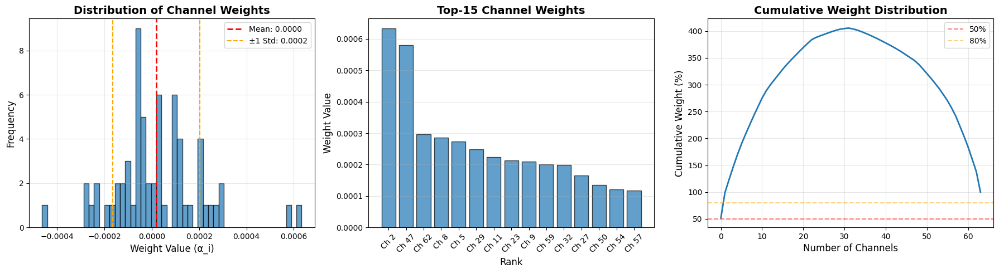


WEIGHT DISTRIBUTION ANALYSIS
Total channels: 64
Mean weight: 0.000019
Std weight: 0.000183
Min weight: -0.000464
Max weight: 0.000633
Weight range: 0.001097

Concentration Analysis:
Top 10% channels (6 channels) contribute: 26.65% of total weight
Top 1 channels contribute 50% of total weight
Top 2 channels contribute 80% of total weight

KL Divergence from uniform: 0.340318
→ Distribution is MODERATELY concentrated

TOP-15 CHANNELS WITH HIGHEST WEIGHTS
Rank   Channel ID   Weight          % of Max    
------------------------------------------------------------
1      2            0.000633        100.00      %
2      47           0.000581        91.76       %
3      62           0.000296        46.71       %
4      8            0.000286        45.19       %
5      5            0.000274        43.28       %
6      29           0.000248        39.21       %
7      11           0.000223        35.27       %
8      23           0.000214        33.74       %
9      9            0.000210    

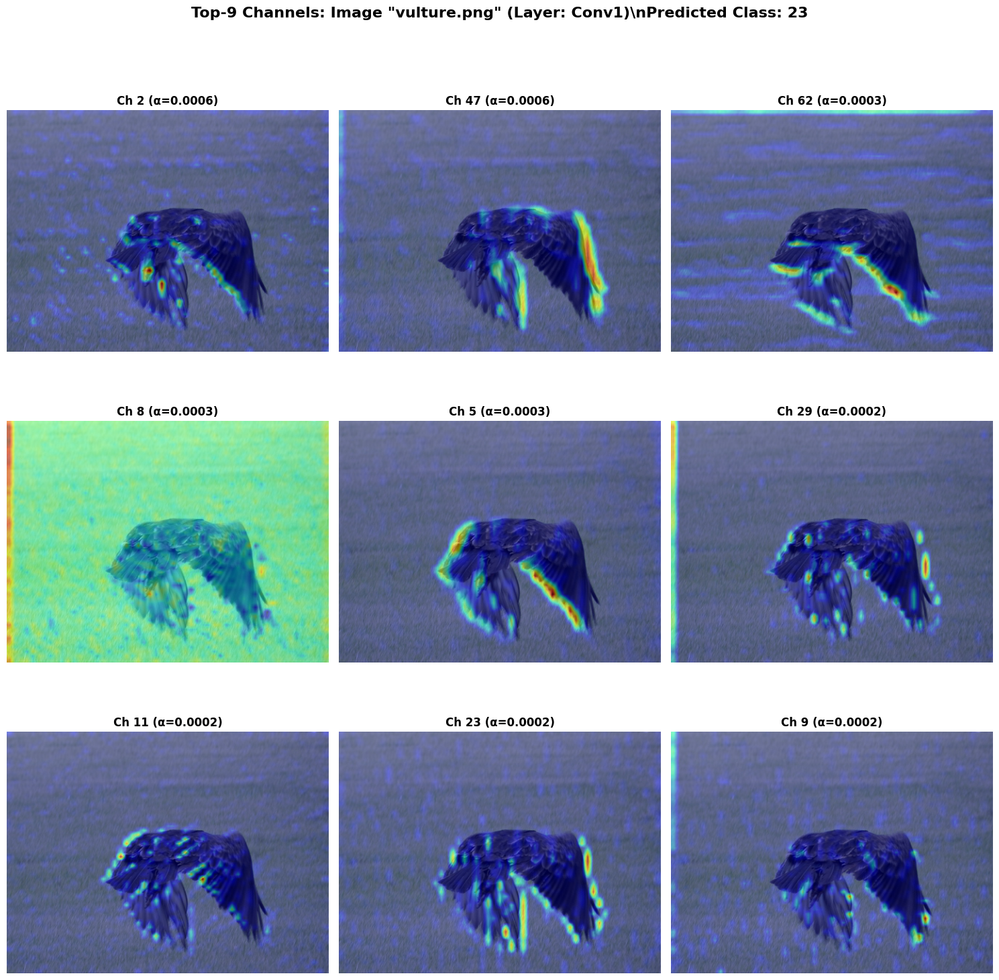

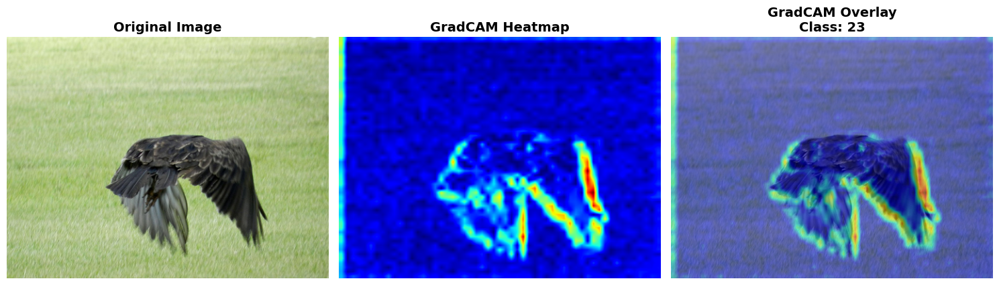

In [125]:
# analyze_layer(0)  # Analyze the last conv layer of features
analyze_layer(0, "Conv1", img_path, class_idx)  # Analyze the last conv layer of features

## 2, Conv2

/home/tam/miniconda3/envs/first-env/lib/python3.13/site-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



  PHÂN TÍCH LAYER: Conv2 (Index: 3)
Predicted class: 23
Number of channels: 192


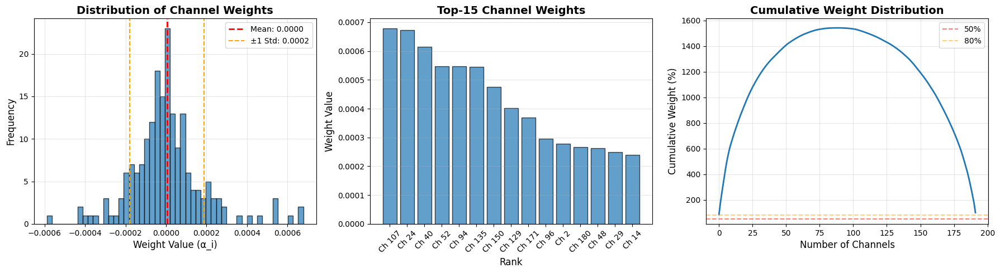


WEIGHT DISTRIBUTION ANALYSIS
Total channels: 192
Mean weight: 0.000004
Std weight: 0.000183
Min weight: -0.000589
Max weight: 0.000679
Weight range: 0.001268

Concentration Analysis:
Top 10% channels (19 channels) contribute: 30.59% of total weight
Top 1 channels contribute 50% of total weight
Top 1 channels contribute 80% of total weight

KL Divergence from uniform: 0.472887
→ Distribution is MODERATELY concentrated

TOP-15 CHANNELS WITH HIGHEST WEIGHTS
Rank   Channel ID   Weight          % of Max    
------------------------------------------------------------
1      107          0.000679        100.00      %
2      24           0.000672        98.99       %
3      40           0.000615        90.62       %
4      52           0.000548        80.72       %
5      94           0.000548        80.67       %
6      135          0.000546        80.42       %
7      150          0.000475        70.01       %
8      129          0.000403        59.35       %
9      171          0.000369  

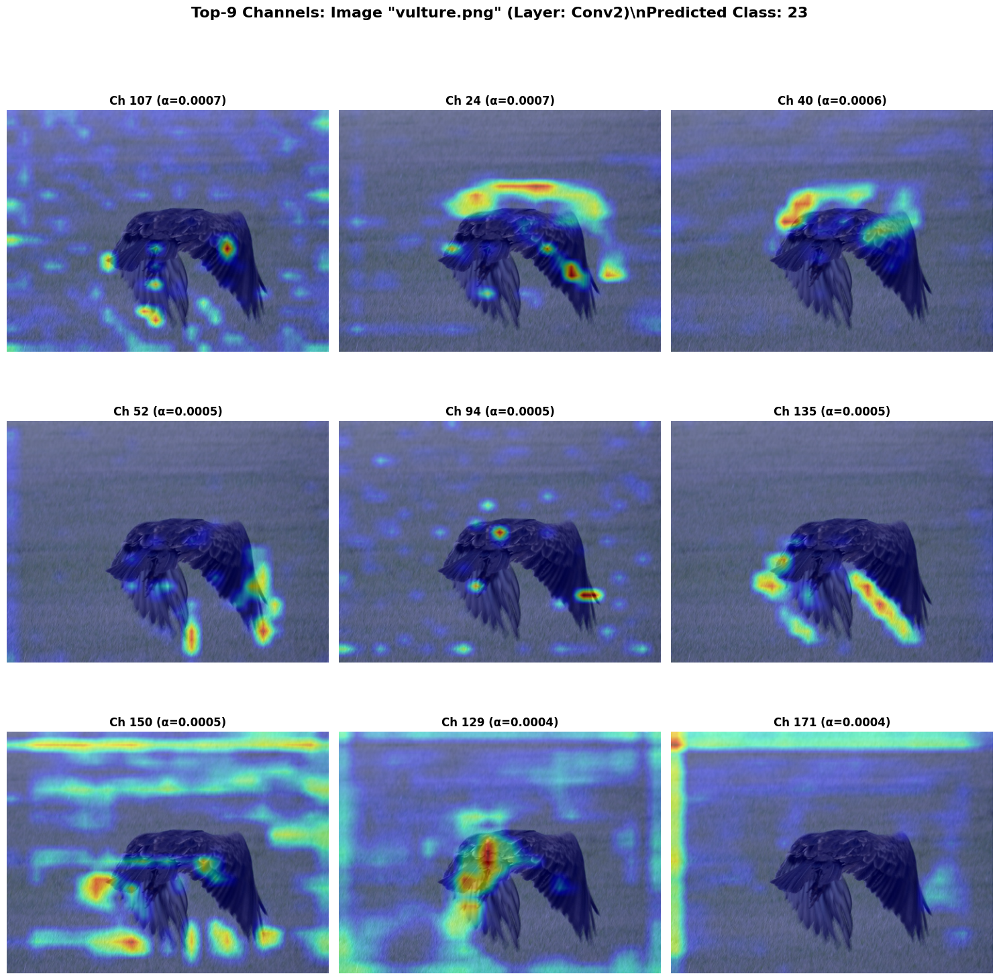

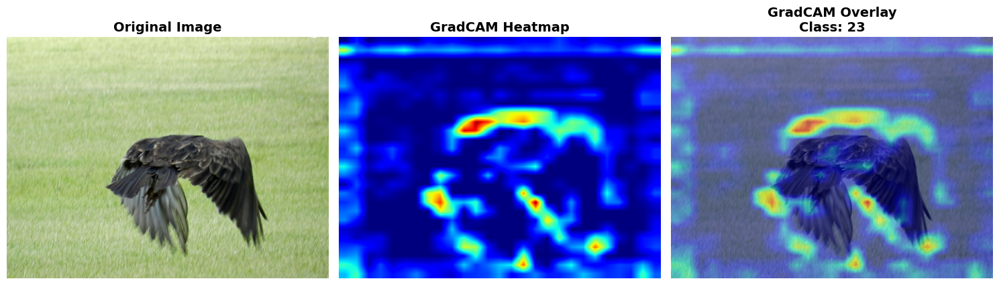

In [126]:
analyze_layer(3, "Conv2", img_path,class_idx)  # Analyze the last conv layer of features

## 3, Conv3

/home/tam/miniconda3/envs/first-env/lib/python3.13/site-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



  PHÂN TÍCH LAYER: Conv3 (Index: 6)
Predicted class: 23
Number of channels: 384


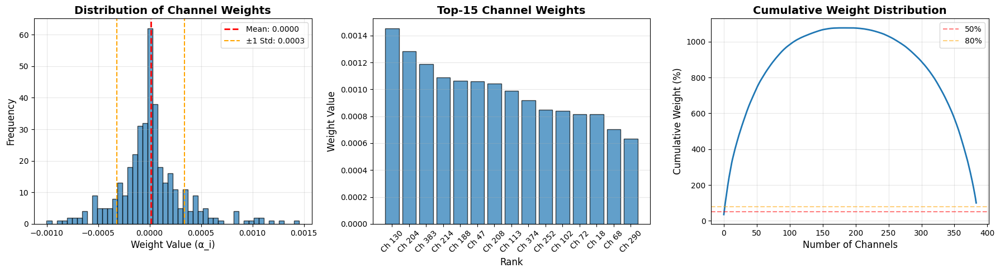


WEIGHT DISTRIBUTION ANALYSIS
Total channels: 384
Mean weight: 0.000011
Std weight: 0.000328
Min weight: -0.001001
Max weight: 0.001453
Weight range: 0.002455

Concentration Analysis:
Top 10% channels (38 channels) contribute: 30.76% of total weight
Top 2 channels contribute 50% of total weight
Top 3 channels contribute 80% of total weight

KL Divergence from uniform: 0.514482
→ Distribution is MODERATELY concentrated

TOP-15 CHANNELS WITH HIGHEST WEIGHTS
Rank   Channel ID   Weight          % of Max    
------------------------------------------------------------
1      130          0.001453        100.00      %
2      204          0.001284        88.35       %
3      383          0.001186        81.61       %
4      214          0.001086        74.76       %
5      188          0.001062        73.07       %
6      47           0.001058        72.82       %
7      208          0.001044        71.83       %
8      113          0.000989        68.03       %
9      374          0.000920  

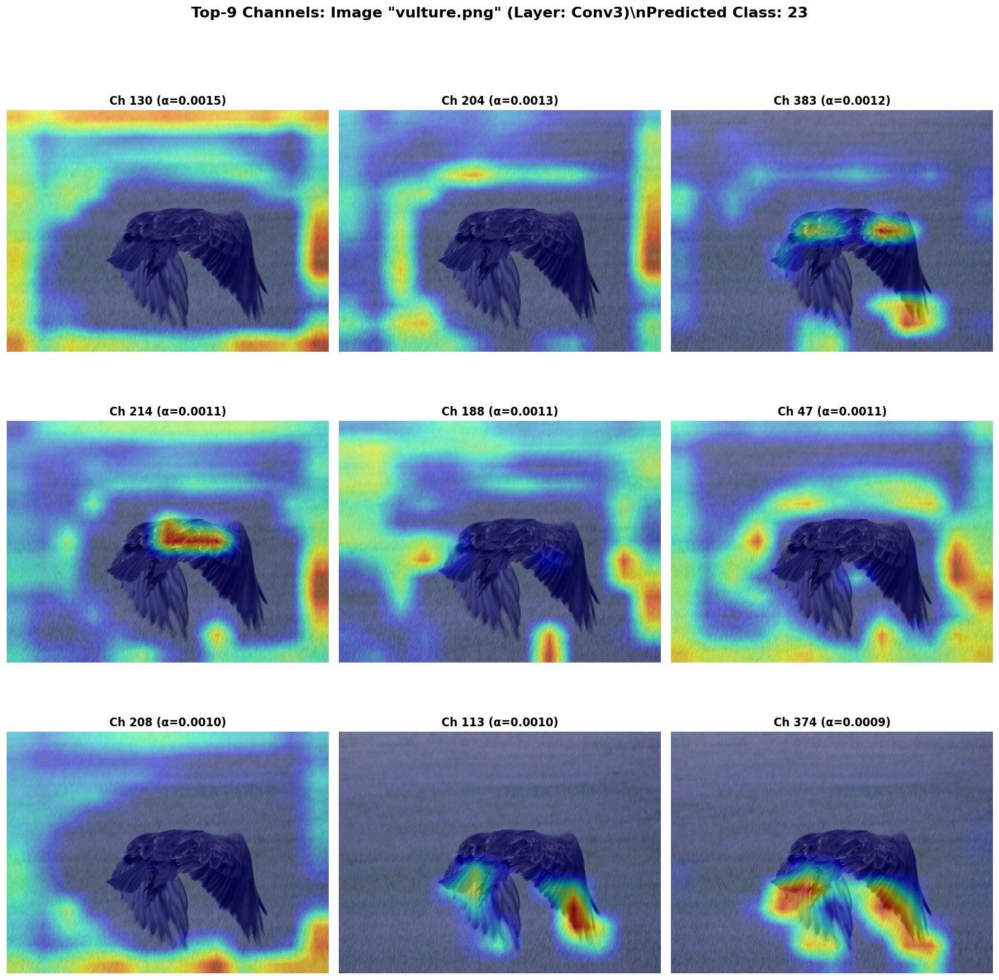

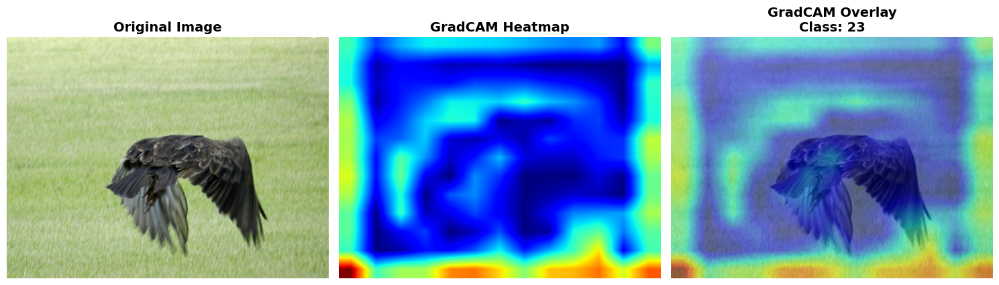

In [127]:
analyze_layer(6, "Conv3", img_path,class_idx)  # Analyze the last conv layer of features

## 4, Conv4

/home/tam/miniconda3/envs/first-env/lib/python3.13/site-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



  PHÂN TÍCH LAYER: Conv4 (Index: 8)
Predicted class: 23
Number of channels: 256


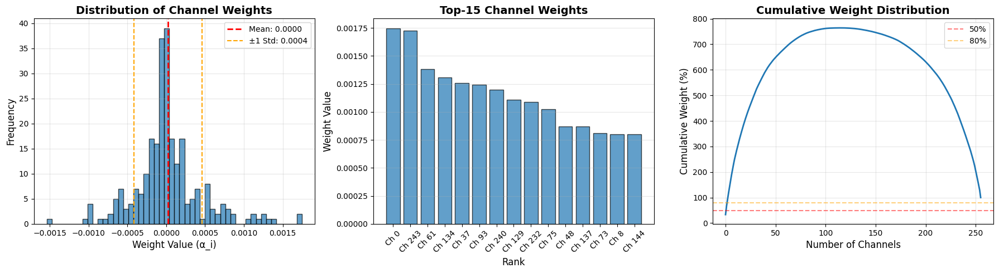


WEIGHT DISTRIBUTION ANALYSIS
Total channels: 256
Mean weight: 0.000020
Std weight: 0.000439
Min weight: -0.001539
Max weight: 0.001747
Weight range: 0.003286

Concentration Analysis:
Top 10% channels (25 channels) contribute: 31.84% of total weight
Top 2 channels contribute 50% of total weight
Top 3 channels contribute 80% of total weight

KL Divergence from uniform: 0.532335
→ Distribution is MODERATELY concentrated

TOP-15 CHANNELS WITH HIGHEST WEIGHTS
Rank   Channel ID   Weight          % of Max    
------------------------------------------------------------
1      0            0.001747        100.00      %
2      243          0.001729        98.95       %
3      61           0.001385        79.28       %
4      134          0.001307        74.80       %
5      37           0.001257        71.96       %
6      93           0.001242        71.11       %
7      240          0.001200        68.67       %
8      129          0.001110        63.53       %
9      232          0.001090  

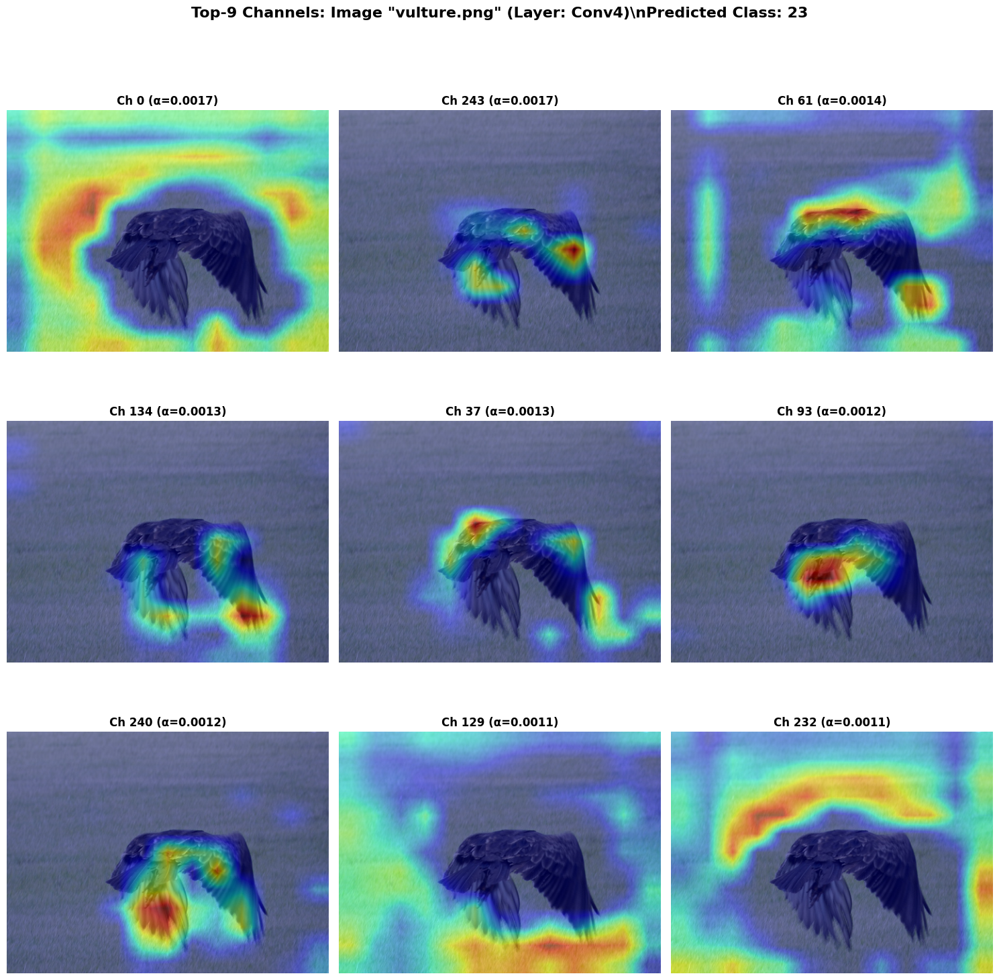

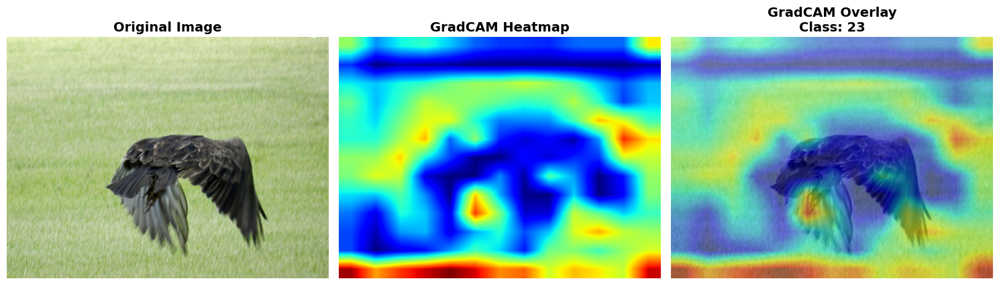

In [128]:
analyze_layer(8, "Conv4", img_path,class_idx)  # Analyze the last conv layer of features

## 5, Conv5

/home/tam/miniconda3/envs/first-env/lib/python3.13/site-packages/torch/nn/modules/module.py:1864: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)



  PHÂN TÍCH LAYER: Conv5 (Index: 10)
Predicted class: 23
Number of channels: 256


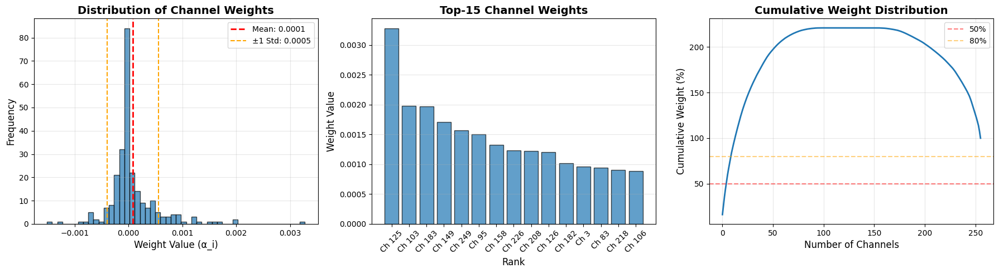


WEIGHT DISTRIBUTION ANALYSIS
Total channels: 256
Mean weight: 0.000079
Std weight: 0.000479
Min weight: -0.001516
Max weight: 0.003279
Weight range: 0.004795

Concentration Analysis:
Top 10% channels (25 channels) contribute: 42.21% of total weight
Top 5 channels contribute 50% of total weight
Top 10 channels contribute 80% of total weight

KL Divergence from uniform: 0.795776
→ Distribution is MODERATELY concentrated

TOP-15 CHANNELS WITH HIGHEST WEIGHTS
Rank   Channel ID   Weight          % of Max    
------------------------------------------------------------
1      125          0.003279        100.00      %
2      103          0.001975        60.25       %
3      183          0.001972        60.14       %
4      149          0.001706        52.05       %
5      249          0.001568        47.83       %
6      95           0.001507        45.98       %
7      158          0.001328        40.51       %
8      226          0.001229        37.48       %
9      208          0.001219 

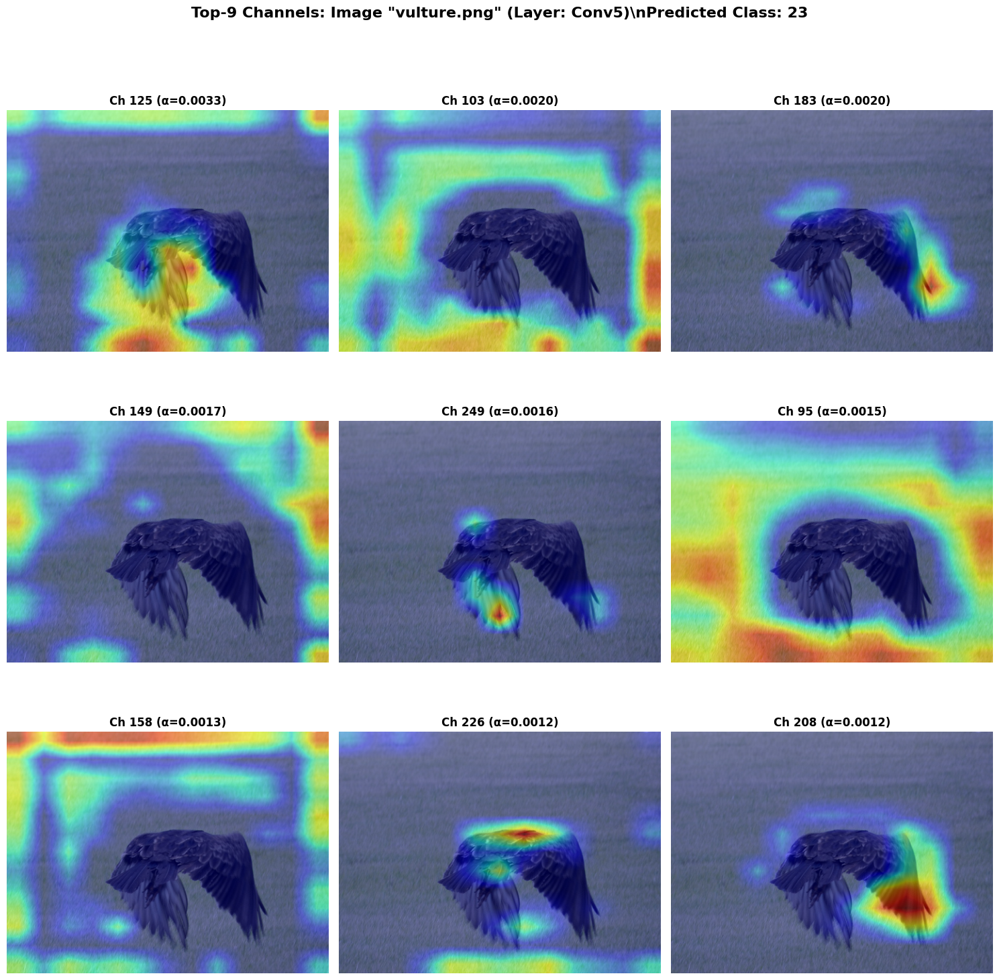

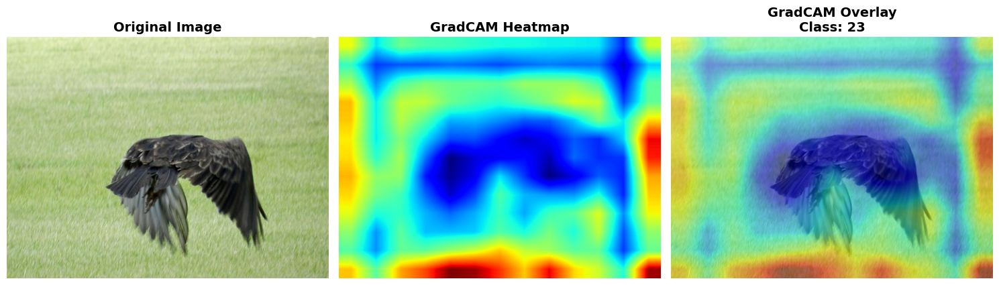

In [129]:
analyze_layer(10, "Conv5", img_path,class_idx)  # Analyze the last conv layer of features